## Module import

In [55]:
import os, site, sys
import tensorflow as tf 
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import Xception
from sklearn.metrics import classification_report
from tensorflow.keras import Model
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import keras_tuner as kt
import cv2

In [31]:
BASE_DIR = "/projectnb/ds340/projects/MS"
train_df = pd.read_csv(os.path.join(BASE_DIR, "train.csv"))
val_df   = pd.read_csv(os.path.join(BASE_DIR, "valid.csv"))
test_df  = pd.read_csv(os.path.join(BASE_DIR, "test.csv"))

## Data Preprocessing

In [32]:
def plot_original_images(path, set_, num_images=5):
    dir_ = os.path.join(path, 'train', set_)
    file_paths = [os.path.join(dir_, file_name) for file_name in os.listdir(dir_)[:num_images]]

    plt.figure(figsize=(10, 5))
    for i, file_path in enumerate(file_paths):
        img = load_img(file_path, target_size=(256, 256))
        plt.subplot(2, num_images, i + 1)
        plt.imshow(img)
        plt.title(f"{set_} - Original")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

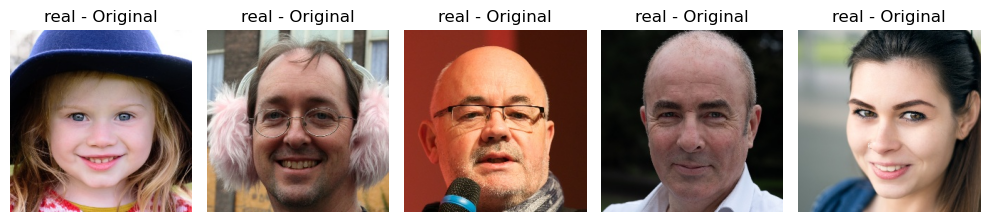

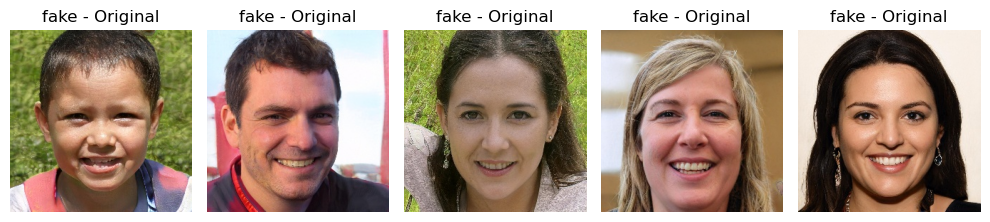

In [33]:
inner = os.listdir(os.path.join(BASE_DIR, "real_vs_fake"))[0]
base_path = os.path.join(BASE_DIR, "real_vs_fake", inner)

plot_original_images(base_path, "real")
plot_original_images(base_path, "fake")

In [6]:
print(len(train_df), len(test_df), len(val_df))

100000 20000 20000


In [7]:
# 20k train / 3k val / 3k test, stratified
train_small, _ = train_test_split(
    train_df, train_size=20_000,
    stratify=train_df["label_str"],
    random_state=42
)
val_small, _ = train_test_split(
    val_df, train_size=3_000,
    stratify=val_df["label_str"],
    random_state=42
)
test_small, _ = train_test_split(
    test_df, train_size=3_000,
    stratify=test_df["label_str"],
    random_state=42
)

In [8]:
print("Train small distribution:\n", train_small['label_str'].value_counts(), "\n")
print("Test small distribution:\n", test_small['label_str'].value_counts(), "\n")
print("Validation small distribution:\n", val_small['label_str'].value_counts(), "\n")

Train small distribution:
 label_str
fake    10000
real    10000
Name: count, dtype: int64 

Test small distribution:
 label_str
fake    1500
real    1500
Name: count, dtype: int64 

Validation small distribution:
 label_str
fake    1500
real    1500
Name: count, dtype: int64 



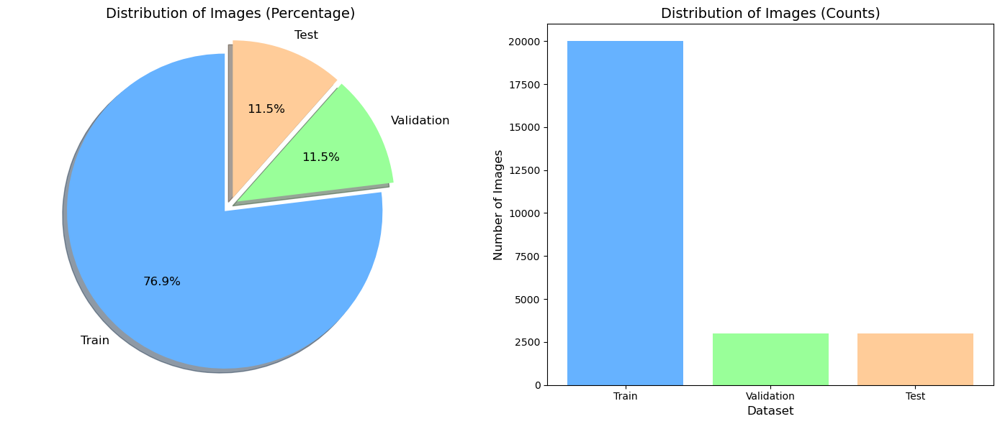

In [9]:
labels = ["Train", "Validation", "Test"]
counts = [
    len(train_small),  
    len(val_small),   
    len(test_small) 
]
colors = ['#66b2ff', '#99ff99', '#ffcc99']
explode = (0.05, 0.05, 0.05)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Pie chart
ax1.pie(
    counts,
    labels=labels,
    autopct="%1.1f%%",
    colors=colors,
    explode=explode,
    shadow=True,
    startangle=90,
    textprops={'fontsize': 12}
)
ax1.set_title("Distribution of Images (Percentage)", fontsize=14)
ax1.axis('equal')

# Bar chart
ax2.bar(labels, counts, color=colors)
ax2.set_xlabel('Dataset', fontsize=12)
ax2.set_ylabel('Number of Images', fontsize=12)
ax2.set_title('Distribution of Images (Counts)', fontsize=14)

plt.tight_layout()
plt.show()

## Data Augmentation Comparison

#### CNN Baseline

In [46]:
def build_baseline_model(input_shape=(224, 224, 3)):
    model = Sequential([
        Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
        MaxPooling2D(),
        
        Conv2D(64, (3,3), activation='relu'),
        MaxPooling2D(),

        Conv2D(128, (3,3), activation='relu'),
        MaxPooling2D(),
    
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    model.compile(
        optimizer='adam',
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

In [47]:
# rescale
baseline_datagen = ImageDataGenerator(
    rescale=1./255
)

train_generator_small = baseline_datagen.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col="path",
    y_col="label_str",
    target_size=(224, 224),
    batch_size=64,
    shuffle=True,
    class_mode="binary"
)

val_generator_small = baseline_datagen.flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col="path",
    y_col="label_str",
    target_size=(224, 224),
    batch_size=64,
    shuffle=False,
    class_mode="binary"
)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [78]:
model_baseline = build_baseline_model()

/share/pkg.8/academic-ml/spring-2025/install/spring-2025-tf/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [80]:
history_baseline = model_baseline.fit(
    train_generator_small,
    validation_data=val_generator_small,
    epochs=10
)

Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.6563 - loss: 0.6244 - val_accuracy: 0.7347 - val_loss: 0.5180
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.7667 - loss: 0.4864 - val_accuracy: 0.7860 - val_loss: 0.4549
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - accuracy: 0.8195 - loss: 0.3892 - val_accuracy: 0.8360 - val_loss: 0.3801
Epoch 4/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 96s 306ms/step - accuracy: 0.8762 - loss: 0.2870 - val_accuracy: 0.8537 - val_loss: 0.3555
Epoch 5/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.9170 - loss: 0.2073 - val_accuracy: 0.8543 - val_loss: 0.3583
Epoch 6/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9444 - loss: 0.1457 - val_accuracy: 0.8683 - val_loss: 0.3565
Epoch 7/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - accuracy: 0.9620 - loss: 0.1023 - val_accuracy: 0.8810 - val_loss: 0.3269
Epoch 8/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.9666 - loss: 0.0873 -

In [81]:
all_histories = {}

In [82]:
all_histories['baseline'] = history_baseline

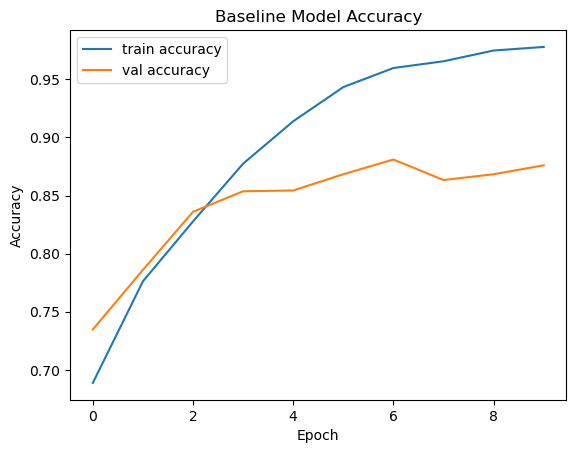

In [83]:
plt.plot(history_baseline.history['accuracy'], label='train accuracy')
plt.plot(history_baseline.history['val_accuracy'], label='val accuracy')
plt.title('Baseline Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Horizontal Flip

In [84]:
flip_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True  
)

In [85]:
train_generator_flip = flip_datagen.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col='path',      
    y_col='label_str',  
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

val_generator_flip = flip_datagen.flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)


Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [87]:
model_flip = build_baseline_model()

history_flip = model_flip.fit(
    train_generator_flip,
    validation_data=val_generator_flip,
    epochs=10
)

Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step - accuracy: 0.5696 - loss: 0.6948 - val_accuracy: 0.6770 - val_loss: 0.6056
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 24s 39ms/step - accuracy: 0.7229 - loss: 0.5511 - val_accuracy: 0.7423 - val_loss: 0.5405
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - accuracy: 0.7638 - loss: 0.4860 - val_accuracy: 0.7773 - val_loss: 0.4665
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - accuracy: 0.8005 - loss: 0.4312 - val_accuracy: 0.7813 - val_loss: 0.4752
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 26s 41ms/step - accuracy: 0.8247 - loss: 0.3945 - val_accuracy: 0.8107 - val_loss: 0.4208
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - accuracy: 0.8511 - loss: 0.3390 - val_accuracy: 0.8103 - val_loss: 0.4187
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - accuracy: 0.8766 - loss: 0.2971 - val_accuracy: 0.8227 - val_loss: 0.4146
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step - accuracy: 0.8939 - loss: 0.2541 - 

In [88]:
all_histories['flip'] = history_flip

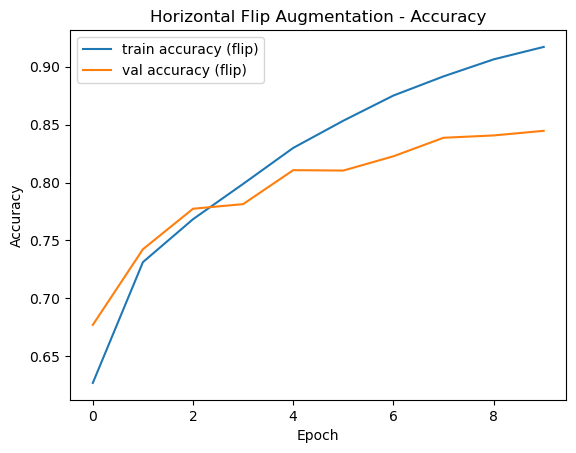

In [89]:
plt.plot(history_flip.history['accuracy'], label='train accuracy (flip)')
plt.plot(history_flip.history['val_accuracy'], label='val accuracy (flip)')
plt.title('Horizontal Flip Augmentation - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Rotation Augmentation

In [90]:
rotation_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20  
)

In [91]:
train_generator_rotation = rotation_datagen.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col='path',       
    y_col='label_str', 
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

val_generator_rotation = rotation_datagen.flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [94]:
rotation_model = build_baseline_model(input_shape=(224, 224, 3))

In [95]:
history_rotation = rotation_model.fit(
    train_generator_rotation,
    epochs=10,
    validation_data=val_generator_rotation,
)

Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 128s 202ms/step - accuracy: 0.5770 - loss: 0.7141 - val_accuracy: 0.6387 - val_loss: 0.6383
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 128s 205ms/step - accuracy: 0.6564 - loss: 0.6159 - val_accuracy: 0.6723 - val_loss: 0.5917
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 130s 207ms/step - accuracy: 0.6919 - loss: 0.5864 - val_accuracy: 0.7127 - val_loss: 0.5536
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 126s 202ms/step - accuracy: 0.7264 - loss: 0.5439 - val_accuracy: 0.7320 - val_loss: 0.5236
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 144s 230ms/step - accuracy: 0.7481 - loss: 0.5179 - val_accuracy: 0.7493 - val_loss: 0.4988
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 134s 214ms/step - accuracy: 0.7672 - loss: 0.4840 - val_accuracy: 0.7690 - val_loss: 0.4936
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 147s 235ms/step - accuracy: 0.7954 - loss: 0.4466 - val_accuracy: 0.7743 - val_loss: 0.4877
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 127s 204ms/step - accuracy: 0.8033 -

In [96]:
all_histories['rotation'] = history_rotation

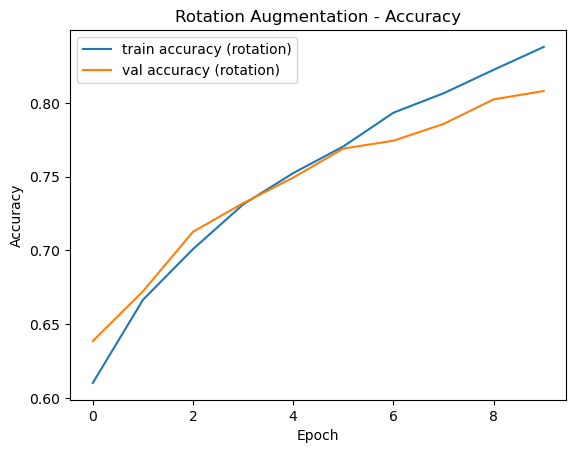

In [97]:
plt.plot(history_rotation.history['accuracy'], label='train accuracy (rotation)')
plt.plot(history_rotation.history['val_accuracy'], label='val accuracy (rotation)')
plt.title('Rotation Augmentation - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Gaussian Noise

In [55]:
def add_gaussian_noise(img):
    img = img.astype(np.float32)
    mean, stddev = 0.0, 25.0                 # noise in pixel space
    noise = np.random.normal(mean, stddev, img.shape)
    noisy = img + noise
    return np.clip(noisy, 0., 255.) 

In [56]:
train_noise_datagen = ImageDataGenerator(
    preprocessing_function=add_gaussian_noise, 
    rescale=1./255  
)
val_noise_datagen = ImageDataGenerator(
    rescale=1./255 
)

In [57]:
train_generator_noise = train_noise_datagen.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col='path',       
    y_col='label_str', 
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

val_generator_noise = val_noise_datagen.flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [64]:
noise_model = build_baseline_model()

history_noise = noise_model.fit(
    train_generator_noise,
    epochs=10,
    validation_data=val_generator_noise
)

Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 100s 159ms/step - accuracy: 0.5090 - loss: 0.7396 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 97s 156ms/step - accuracy: 0.5338 - loss: 0.6846 - val_accuracy: 0.6817 - val_loss: 0.6064
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 98s 156ms/step - accuracy: 0.6798 - loss: 0.6041 - val_accuracy: 0.7037 - val_loss: 0.5697
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 97s 156ms/step - accuracy: 0.7317 - loss: 0.5382 - val_accuracy: 0.7330 - val_loss: 0.5357
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 98s 157ms/step - accuracy: 0.7639 - loss: 0.4881 - val_accuracy: 0.7517 - val_loss: 0.5172
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 97s 155ms/step - accuracy: 0.7891 - loss: 0.4424 - val_accuracy: 0.7593 - val_loss: 0.4897
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 99s 158ms/step - accuracy: 0.8146 - loss: 0.4008 - val_accuracy: 0.7707 - val_loss: 0.4994
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 98s 157ms/step - accuracy: 0.8425 - loss: 

In [65]:
all_histories['gaussian_noise'] = history_noise

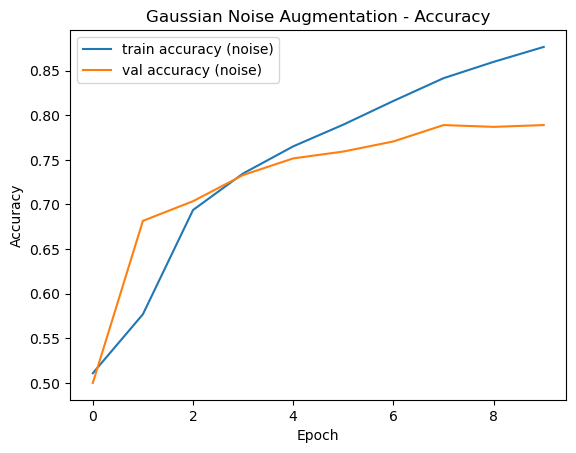

In [66]:
plt.plot(history_noise.history['accuracy'], label='train accuracy (noise)')
plt.plot(history_noise.history['val_accuracy'], label='val accuracy (noise)')
plt.title('Gaussian Noise Augmentation - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

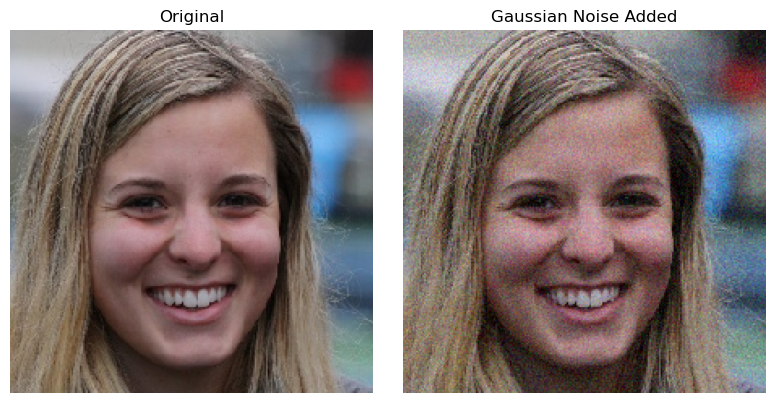

In [64]:
# Randomly fetch one image from the training generator
img, label = next(train_generator_baseline)  # Use the baseline generator to fetch a clean image
img = img[0]  # Take the first image from the batch

# Apply Gaussian noise to the image
noisy_img = add_gaussian_noise(img)

# Plot the original vs. the noisy image
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(noisy_img)
plt.title('Gaussian Noise Added')
plt.axis('off')

plt.tight_layout()
plt.show()


### JPEG Compression Artifacts

In [67]:
import cv2

In [68]:
def jpeg_compression(img):
    img_uint8 = img.astype(np.uint8)
    _, enc = cv2.imencode('.jpg', img_uint8, [cv2.IMWRITE_JPEG_QUALITY, 50])
    dec = cv2.imdecode(enc, cv2.IMREAD_COLOR)
    return dec.astype(np.float32) 

In [69]:
train_jpeg_datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=jpeg_compression
)
val_jpeg_datagen = ImageDataGenerator(
    rescale=1./255)    

In [70]:
train_generator_jpeg = train_jpeg_datagen.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col='path',       
    y_col='label_str', 
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

val_generator_jpeg = val_jpeg_datagen.flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [72]:
jpeg_model = build_baseline_model()

history_jpeg = jpeg_model.fit(
    train_generator_jpeg,
    epochs=10,
    validation_data=val_generator_jpeg,
)


Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - accuracy: 0.5901 - loss: 0.6821 - val_accuracy: 0.6920 - val_loss: 0.5950
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - accuracy: 0.7230 - loss: 0.5568 - val_accuracy: 0.7460 - val_loss: 0.5073
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - accuracy: 0.7826 - loss: 0.4599 - val_accuracy: 0.7497 - val_loss: 0.5265
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 78s 59ms/step - accuracy: 0.8343 - loss: 0.3701 - val_accuracy: 0.7937 - val_loss: 0.4478
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - accuracy: 0.8823 - loss: 0.2800 - val_accuracy: 0.8287 - val_loss: 0.4184
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step - accuracy: 0.9191 - loss: 0.1991 - val_accuracy: 0.8177 - val_loss: 0.4432
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step - accuracy: 0.9355 - loss: 0.1635 - val_accuracy: 0.8193 - val_loss: 0.5139
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step - accuracy: 0.9501 - loss: 0.1247 - 

In [73]:
all_histories['jpeg_compression'] = history_jpeg

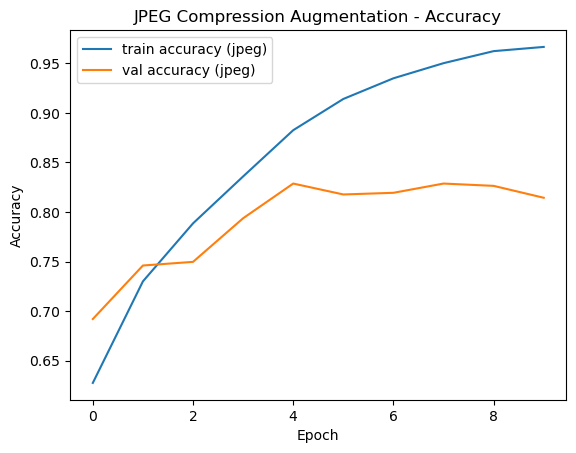

In [74]:
plt.plot(history_jpeg.history['accuracy'], label='train accuracy (jpeg)')
plt.plot(history_jpeg.history['val_accuracy'], label='val accuracy (jpeg)')
plt.title('JPEG Compression Augmentation - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

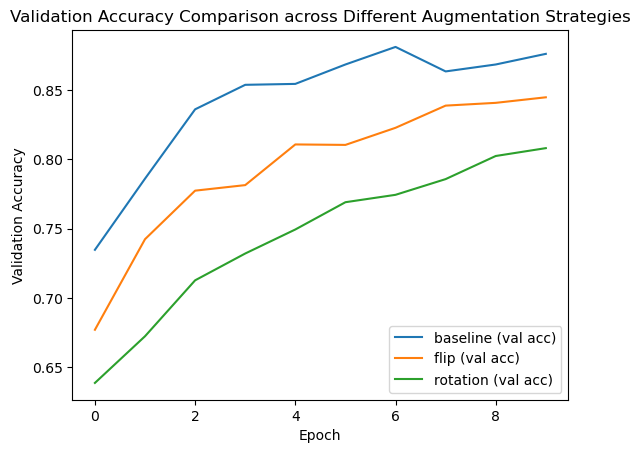

In [98]:
for strategy_name, history in all_histories.items():
    plt.plot(history.history['val_accuracy'], label=f'{strategy_name} (val acc)')

plt.title('Validation Accuracy Comparison across Different Augmentation Strategies')
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.show()

## Advanced Data Augmentation

Found 20000 validated image filenames belonging to 2 classes.
Without Augmentation:


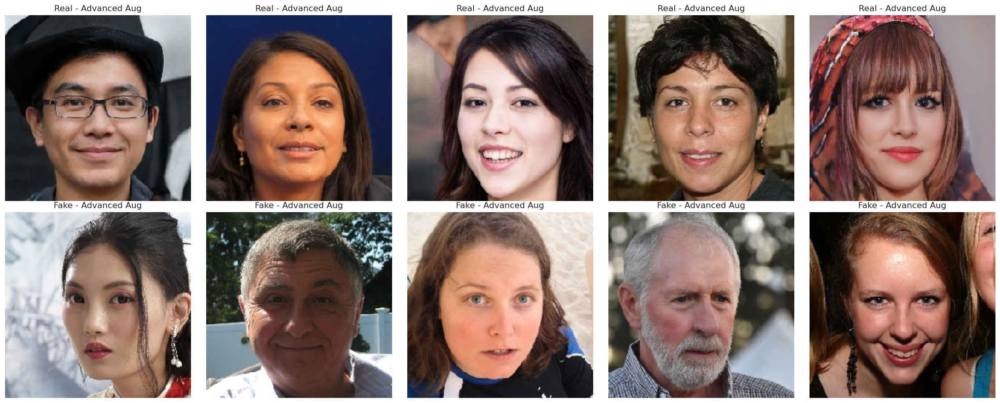

Advanced Augmentation:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45756865..0.26007846].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46541178..0.4669059].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.39090198..0.557102].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46933335..0.38847452].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.36383924..0.59239614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48501962..0.59239614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [

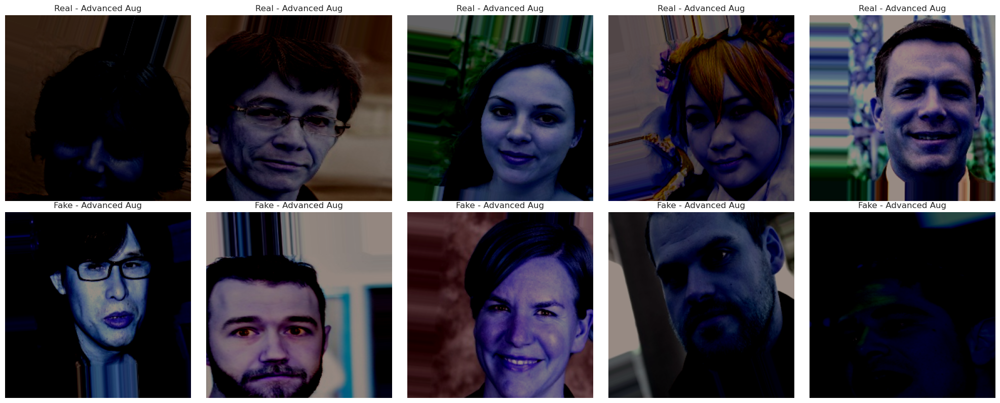

In [49]:
# Define advanced augmentation techniques
def get_advanced_augmentation():
    return ImageDataGenerator(
        rescale=1./255,
        preprocessing_function=preprocess_input,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=False,
        fill_mode='nearest',
        brightness_range=[0.7, 1.3],
        channel_shift_range=20,
        # JPEG compression simulation
        zca_whitening=False,  # Adding noise similar to JPEG artifacts
        zca_epsilon=1e-6
    )

# Create the advanced augmentation generator
advanced_gen_data = get_advanced_augmentation()

# Create new generators with advanced augmentation
advanced_train_generator = advanced_gen_data.flow_from_dataframe(
    dataframe=train_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    color_mode="rgb",
    target_size=(256, 256),
    class_mode="binary",
    batch_size=32,
    shuffle=True
)

# Visualization of advanced augmentation
def visualize_augmentation(gen, n_samples=5):
    images, labels = next(gen)
    real_images = images[labels == 0]
    fake_images = images[labels == 1]
    
    plt.figure(figsize=(20, 8))
    
    # Display real images
    for i in range(n_samples):
        plt.subplot(2, n_samples, i + 1)
        plt.imshow(real_images[i])
        plt.title("Real - Advanced Aug")
        plt.axis('off')
    
    # Display fake images
    for i in range(n_samples):
        plt.subplot(2, n_samples, i + n_samples + 1)
        plt.imshow(fake_images[i])
        plt.title("Fake - Advanced Aug")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

# Visualize the augmented images
print("Without Augmentation:")
visualize_augmentation(train_generator_small)

print("Advanced Augmentation:")
visualize_augmentation(advanced_train_generator)

In [50]:
# Build a model to test with advanced augmentation
cnn_advanced_aug = Sequential()
cnn_advanced_aug.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)))
cnn_advanced_aug.add(MaxPooling2D((2, 2)))
cnn_advanced_aug.add(Conv2D(64, (3, 3), activation='relu'))
cnn_advanced_aug.add(MaxPooling2D((2, 2)))
cnn_advanced_aug.add(Conv2D(64, (3, 3), activation='relu'))
cnn_advanced_aug.add(MaxPooling2D((2, 2)))
cnn_advanced_aug.add(Dropout(0.2))
cnn_advanced_aug.add(Flatten())
cnn_advanced_aug.add(Dense(64, activation='relu'))
cnn_advanced_aug.add(Dropout(0.2))
cnn_advanced_aug.add(Dense(1, activation='sigmoid'))

cnn_advanced_aug.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Create non-augmented validation and test generators
validation_generator_no_aug = ImageDataGenerator(
    rescale=1./255.,
    preprocessing_function=preprocess_input
).flow_from_dataframe(
    dataframe=val_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    color_mode="rgb",
    target_size=(256, 256),
    class_mode="binary",
    batch_size=32,
    shuffle=True
)

test_generator_no_aug = ImageDataGenerator(
    rescale=1./255.,
    preprocessing_function=preprocess_input
).flow_from_dataframe(
    dataframe=test_small,
    directory=base_path,
    x_col='path',
    y_col='label_str',
    color_mode="rgb",
    target_size=(256, 256),
    class_mode="binary",
    batch_size=32,
    shuffle=False
)

/share/pkg.8/academic-ml/spring-2025/install/spring-2025-tf/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Found 3000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [56]:
# Train the model with advanced augmentation
with tf.device('/GPU:0'):
    history_advanced_aug = cnn_advanced_aug.fit(
        advanced_train_generator,
        epochs=15,
        validation_data=validation_generator_no_aug
    )

# Evaluate the model
test_loss_adv, test_accuracy_adv = cnn_advanced_aug.evaluate(test_generator_no_aug)
print(f'Advanced Augmentation Model - Loss: {test_loss_adv}, Accuracy: {test_accuracy_adv}')


Epoch 1/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 344s 551ms/step - accuracy: 0.4916 - loss: 0.6937 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 2/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 334s 535ms/step - accuracy: 0.4973 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 3/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 337s 539ms/step - accuracy: 0.5009 - loss: 0.6933 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 4/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 303s 485ms/step - accuracy: 0.5093 - loss: 0.6939 - val_accuracy: 0.5000 - val_loss: 0.6936
Epoch 5/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 284s 454ms/step - accuracy: 0.5041 - loss: 0.6932 - val_accuracy: 0.5697 - val_loss: 0.6888
Epoch 6/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 286s 458ms/step - accuracy: 0.5381 - loss: 0.6904 - val_accuracy: 0.5657 - val_loss: 0.6879
Epoch 7/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 270s 433ms/step - accuracy: 0.5571 - loss: 0.6871 - val_accuracy: 0.6157 - val_loss: 0.6697
Epoch 8/15
625/625 ━━━━━━━━━━━━━━━━━━━━ 282s 451ms/step - accuracy: 0.5682 -

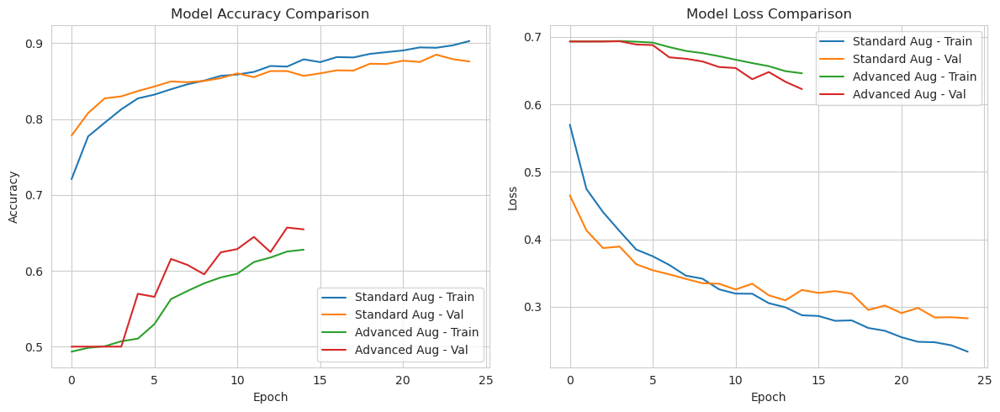

In [61]:
# Compare the models (regular vs advanced augmentation)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Standard Aug - Train')
plt.plot(history.history['val_accuracy'], label='Standard Aug - Val')
plt.plot(history_advanced_aug.history['accuracy'], label='Advanced Aug - Train')
plt.plot(history_advanced_aug.history['val_accuracy'], label='Advanced Aug - Val')
plt.title('Model Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Standard Aug - Train')
plt.plot(history.history['val_loss'], label='Standard Aug - Val')
plt.plot(history_advanced_aug.history['loss'], label='Advanced Aug - Train')
plt.plot(history_advanced_aug.history['val_loss'], label='Advanced Aug - Val')
plt.title('Model Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

## Data Augmentation

In [10]:
gen_data = ImageDataGenerator(
    rescale=1./255.,
    preprocessing_function=preprocess_input,
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.05,
    brightness_range=(0.9,1.1),
    channel_shift_range=5,
    horizontal_flip=True,
    fill_mode='reflect'
)

In [11]:
def make_gen(df, batch_size=64, shuffle=True):
    return gen_data.flow_from_dataframe(
        dataframe=df,
        directory=base_path,
        x_col="path",
        y_col="label_str",
        target_size=(256,256),
        color_mode="rgb",
        class_mode="binary",
        batch_size=batch_size,
        shuffle=shuffle,
    )

In [12]:
train_gen = make_gen(train_small, batch_size=64, shuffle=True)
val_gen   = make_gen(val_small,   batch_size=64, shuffle=False)
test_gen  = make_gen(test_small,  batch_size=64, shuffle=False)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


In [13]:
# Define the ImageDataGenerator for EfficientNetB0 training set 
gen_data_224 = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.05,
    brightness_range=(0.9, 1.1),
    channel_shift_range=5,
    horizontal_flip=True,
    fill_mode='reflect'
)

val_test_datagen224 = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)


def make_gen224(df, batch_size=64, shuffle=True):
    return gen_data_224.flow_from_dataframe(
        dataframe=df,
        directory=base_path,
        x_col="path",
        y_col="label_str",
        target_size=(224, 224),   
        color_mode="rgb",
        class_mode="binary",
        batch_size=batch_size,
        shuffle=shuffle,
    )


# new Generator
train_gen224 = make_gen224(train_small, batch_size=64, shuffle=True)
val_gen224 = make_gen224(val_small, batch_size=64, shuffle=False)
test_gen224 = make_gen224(test_small, batch_size=64, shuffle=False)

Found 20000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.
Found 3000 validated image filenames belonging to 2 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48501962..0.52965105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48501962..0.5492589].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45795688..0.5218079].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.43011767..0.5453373].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4771765..0.5374942].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4379608..0.59239614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.

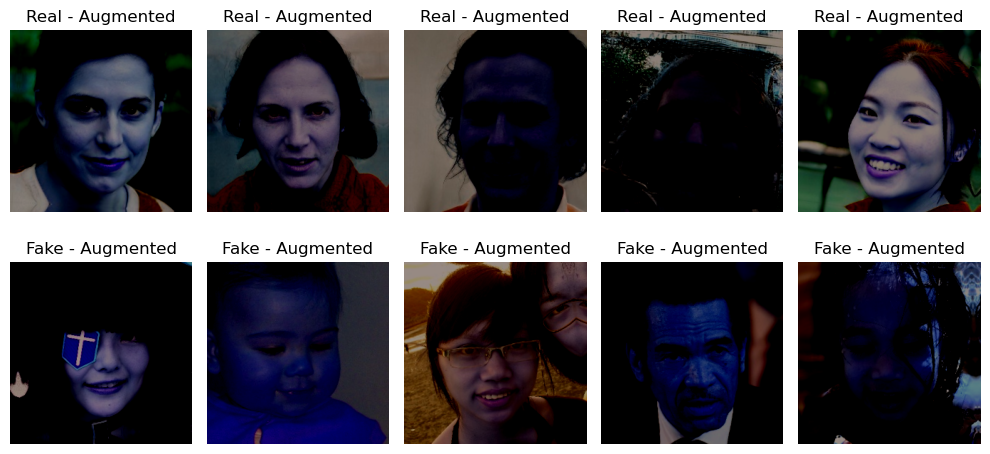

In [14]:
images, labels = next(train_gen)

real_images = images[labels == 0]
fake_images = images[labels == 1]

# Plot 5 real/fake images
plt.figure(figsize=(10, 5))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(real_images[i])
    plt.title("Real - Augmented")
    plt.axis('off')
for i in range(5):
    plt.subplot(2, 5, i + 6)
    plt.imshow(fake_images[i])
    plt.title("Fake - Augmented")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Model Preparation - GPU

In [15]:
# Check GPU Availability
print("GPUs Available:", tf.config.list_physical_devices('GPU'))
print("Built with CUDA:", tf.test.is_built_with_cuda())

GPUs Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Built with CUDA: True


In [16]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

In [17]:
os.environ["CUDA_VISIBLE_DEVICES"]="0"  # Use GPU 0, or try other numbers if available

In [18]:
tf.keras.backend.clear_session()

## Model Training

### CNN

In [39]:
model_cnn = Sequential()
model_cnn.add(Conv2D(32,kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)))
model_cnn.add(MaxPooling2D((2, 2)))
model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))
model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))
model_cnn.add(Dropout(0.2))
model_cnn.add(Flatten())
model_cnn.add(Dense(64, activation='relu'))
model_cnn.add(Dropout(0.2))
model_cnn.add(Dense(1, activation='sigmoid'))
model_cnn.summary()

/share/pkg.8/academic-ml/spring-2025/install/spring-2025-tf/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1746041205.369580  160701 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43500 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:61:00.0, compute capability: 8.9


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     3,686,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,742,849 (14.28 MB)

 Trainable params: 3,742,849 (14.28 MB)

 Non-trainable params: 0 (0.00 B)

In [40]:
model_cnn.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [42]:
history_c = model_cnn.fit(
    train_gen,
    epochs=25,
    validation_data=val_gen,)

Epoch 1/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 199s 630ms/step - accuracy: 0.5918 - loss: 0.6782 - val_accuracy: 0.6433 - val_loss: 0.6327
Epoch 2/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 197s 630ms/step - accuracy: 0.6594 - loss: 0.6223 - val_accuracy: 0.6917 - val_loss: 0.5926
Epoch 3/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 634ms/step - accuracy: 0.6791 - loss: 0.6026 - val_accuracy: 0.7007 - val_loss: 0.5748
Epoch 4/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 197s 629ms/step - accuracy: 0.6972 - loss: 0.5767 - val_accuracy: 0.7190 - val_loss: 0.5413
Epoch 5/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 633ms/step - accuracy: 0.7334 - loss: 0.5376 - val_accuracy: 0.7377 - val_loss: 0.5300
Epoch 6/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 632ms/step - accuracy: 0.7456 - loss: 0.5149 - val_accuracy: 0.7603 - val_loss: 0.4863
Epoch 7/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 632ms/step - accuracy: 0.7647 - loss: 0.4854 - val_accuracy: 0.7507 - val_loss: 0.5010
Epoch 8/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 199s 636ms/step - accuracy: 0.7779 -

In [43]:
test_loss, test_accuracy = model_cnn.evaluate(test_gen)
print(f'Loss: {test_loss}, Accuracy: {test_accuracy}')

47/47 ━━━━━━━━━━━━━━━━━━━━ 26s 546ms/step - accuracy: 0.8589 - loss: 0.3261
Loss: 0.32617753744125366, Accuracy: 0.862333357334137


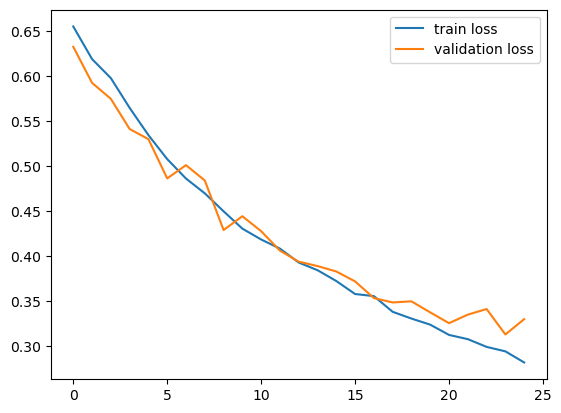

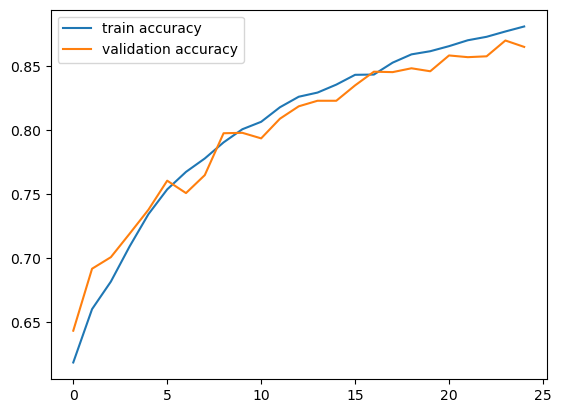

In [44]:
plt.plot(history_c.history['loss'], label='train loss')
plt.plot(history_c.history['val_loss'], label='validation loss')
plt.legend()
plt.show()


plt.plot(history_c.history['accuracy'], label='train accuracy')
plt.plot(history_c.history['val_accuracy'], label='validation accuracy')
plt.legend()
plt.show()

47/47 ━━━━━━━━━━━━━━━━━━━━ 25s 539ms/step


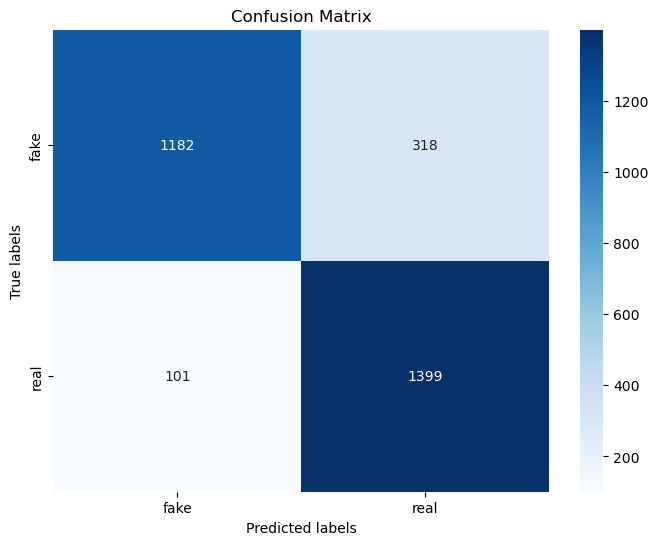

In [45]:
predictions = model_cnn.predict(test_gen)
predicted_labels = np.where(predictions > 0.5, 1, 0)
true_labels = test_gen.classes

conf_matrix = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_gen.class_indices,
            yticklabels=test_gen.class_indices)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [46]:
class_names = list(test_gen.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

        fake       0.92      0.79      0.85      1500
        real       0.81      0.93      0.87      1500

    accuracy                           0.86      3000
   macro avg       0.87      0.86      0.86      3000
weighted avg       0.87      0.86      0.86      3000



### XceptionNet

In [41]:
base_model = Xception(weights='imagenet',include_top=False,input_shape=(256, 256, 3))

In [42]:
for layer in base_model.layers:
    layer.trainable = False

Xception_model = Sequential()
Xception_model.add(base_model)
Xception_model.add(Flatten())
Xception_model.add(BatchNormalization())
Xception_model.add(Dense(256, activation='relu'))
Xception_model.add(Dropout(0.5))
Xception_model.add(Dense(128, activation='relu'))
Xception_model.add(Dropout(0.5))
Xception_model.add(BatchNormalization())
Xception_model.add(Dense(1, activation='sigmoid'))
Xception_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ xception (Functional)           │ (None, 8, 8, 2048)     │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 131072)         │       524,288 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    33,554,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,973,993 (209.71 MB)

 Trainable params: 33,850,113 (129.13 MB)

 Non-trainable params: 21,123,880 (80.58 MB)

In [43]:
Xception_model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [51]:
history_x = Xception_model.fit(
    train_gen,
    epochs=25,
    validation_data=val_gen,)

Epoch 1/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 634ms/step - accuracy: 0.7990 - loss: 0.4354 - val_accuracy: 0.8030 - val_loss: 0.4278
Epoch 2/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 199s 636ms/step - accuracy: 0.8141 - loss: 0.4155 - val_accuracy: 0.8210 - val_loss: 0.3897
Epoch 3/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 633ms/step - accuracy: 0.8306 - loss: 0.3793 - val_accuracy: 0.8203 - val_loss: 0.3886
Epoch 4/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 199s 637ms/step - accuracy: 0.8334 - loss: 0.3759 - val_accuracy: 0.8377 - val_loss: 0.3750
Epoch 5/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 199s 634ms/step - accuracy: 0.8379 - loss: 0.3665 - val_accuracy: 0.8160 - val_loss: 0.3910
Epoch 6/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 197s 631ms/step - accuracy: 0.8472 - loss: 0.3435 - val_accuracy: 0.8387 - val_loss: 0.3686
Epoch 7/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 197s 631ms/step - accuracy: 0.8560 - loss: 0.3290 - val_accuracy: 0.8323 - val_loss: 0.3630
Epoch 8/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 198s 634ms/step - accuracy: 0.8577 -

In [52]:
test_loss, test_accuracy = Xception_model.evaluate(test_gen)
print(f'Loss: {test_loss}, Accuracy: {test_accuracy}')

47/47 ━━━━━━━━━━━━━━━━━━━━ 26s 545ms/step - accuracy: 0.8603 - loss: 0.3532
Loss: 0.35817182064056396, Accuracy: 0.8543333411216736


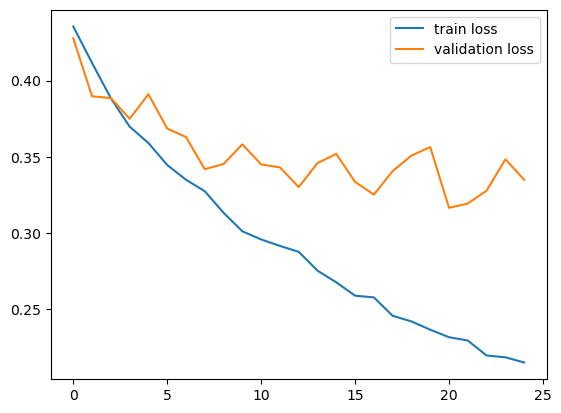

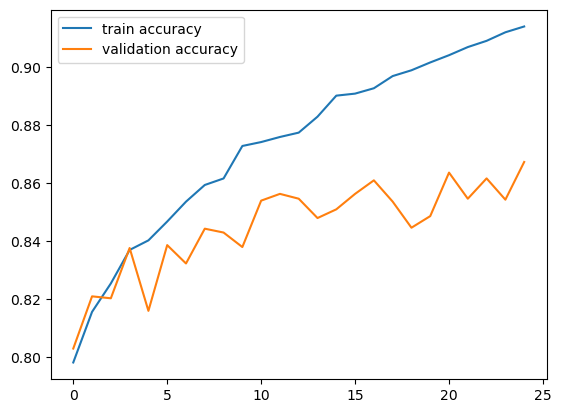

In [53]:
plt.plot(history_x.history['loss'], label='train loss')
plt.plot(history_x.history['val_loss'], label='validation loss')
plt.legend()
plt.show()


plt.plot(history_x.history['accuracy'], label='train accuracy')
plt.plot(history_x.history['val_accuracy'], label='validation accuracy')
plt.legend()
plt.show()

47/47 ━━━━━━━━━━━━━━━━━━━━ 28s 562ms/step


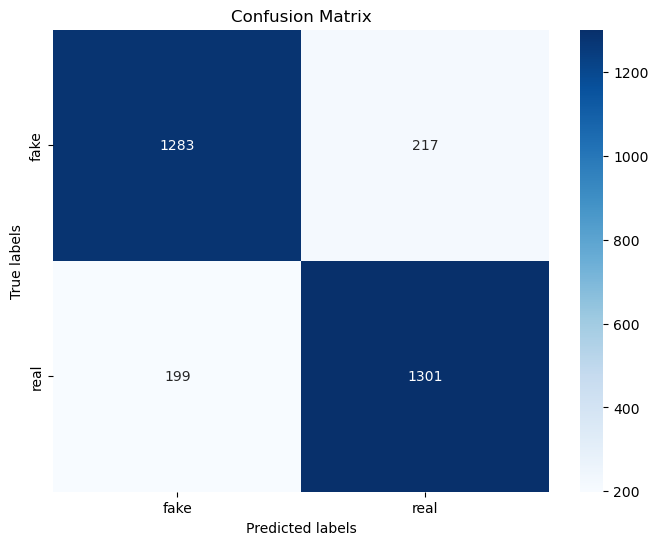

In [54]:
predictions = Xception_model.predict(test_gen)
predicted_labels = np.where(predictions > 0.5, 1, 0)
true_labels = test_gen.classes

conf_matrix = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_gen.class_indices,
            yticklabels=test_gen.class_indices)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [55]:
class_names = list(test_gen.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

        fake       0.87      0.86      0.86      1500
        real       0.86      0.87      0.86      1500

    accuracy                           0.86      3000
   macro avg       0.86      0.86      0.86      3000
weighted avg       0.86      0.86      0.86      3000



### EfficientNet

In [10]:
IMG_SIZE, BATCH_SIZE = 224, 32

In [44]:
EfficientNet_model = Sequential()

base_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)
base_model.trainable = False

EfficientNet_model.add(base_model)
EfficientNet_model.add(GlobalAveragePooling2D())
EfficientNet_model.add(BatchNormalization())
EfficientNet_model.add(Dense(1024, activation='swish'))
EfficientNet_model.add(Dropout(0.5))
EfficientNet_model.add(BatchNormalization())
EfficientNet_model.add(Dense(512, activation='swish'))
EfficientNet_model.add(Dropout(0.3))
EfficientNet_model.add(Dense(1, activation='sigmoid'))

# Display model summary
EfficientNet_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1024)           │     1,311,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,895,844 (22.49 MB)

 Trainable params: 1,841,665 (7.03 MB)

 Non-trainable params: 4,054,179 (15.47 MB)

In [45]:
# Compile the model
EfficientNet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Train the model
history_e = EfficientNet_model.fit(
    train_gen224,
    epochs=5,
    validation_data=val_gen224,
)

In [20]:
model = build_model()
history = model.fit(
    train_gen224,
    epochs=25, 
    validation_data=val_gen224,
)

Epoch 1/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 346s 1s/step - accuracy: 0.6811 - loss: 0.6241 - val_accuracy: 0.7783 - val_loss: 0.4652
Epoch 2/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 275s 878ms/step - accuracy: 0.7741 - loss: 0.4772 - val_accuracy: 0.8080 - val_loss: 0.4134
Epoch 3/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 304s 973ms/step - accuracy: 0.7904 - loss: 0.4503 - val_accuracy: 0.8273 - val_loss: 0.3872
Epoch 4/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 275s 880ms/step - accuracy: 0.8068 - loss: 0.4225 - val_accuracy: 0.8300 - val_loss: 0.3894
Epoch 5/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 304s 971ms/step - accuracy: 0.8257 - loss: 0.3868 - val_accuracy: 0.8370 - val_loss: 0.3633
Epoch 6/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 313s 1s/step - accuracy: 0.8348 - loss: 0.3709 - val_accuracy: 0.8430 - val_loss: 0.3542
Epoch 7/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 342s 1s/step - accuracy: 0.8397 - loss: 0.3603 - val_accuracy: 0.8497 - val_loss: 0.3482
Epoch 8/25
313/313 ━━━━━━━━━━━━━━━━━━━━ 314s 1s/step - accuracy: 0.8506 - loss: 0.336

In [21]:
test_loss, test_accuracy = model.evaluate(test_gen224)
print(f'Loss: {test_loss}, Accuracy: {test_accuracy}')

47/47 ━━━━━━━━━━━━━━━━━━━━ 30s 634ms/step - accuracy: 0.8889 - loss: 0.2706
Loss: 0.2731236219406128, Accuracy: 0.8846666812896729


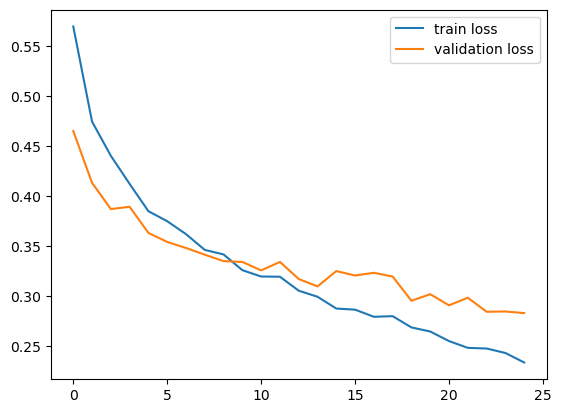

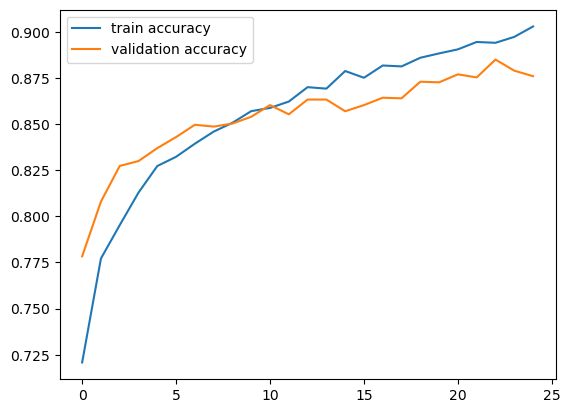

In [22]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.legend()
plt.show()

47/47 ━━━━━━━━━━━━━━━━━━━━ 37s 705ms/step


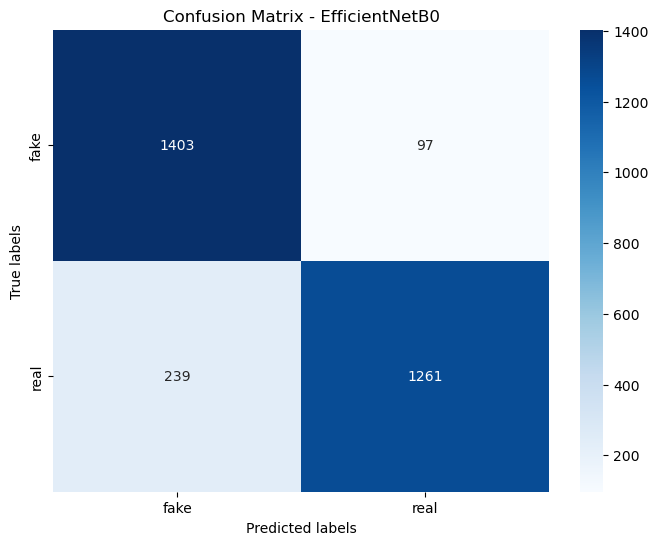

In [23]:
predictions = model.predict(test_gen224)
predicted_labels = np.where(predictions > 0.5, 1, 0)
true_labels = test_gen224.classes

conf_matrix = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_gen224.class_indices.keys()),
            yticklabels=list(test_gen224.class_indices.keys()))
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - EfficientNetB0')
plt.show()

In [24]:
class_names = list(test_gen224.class_indices.keys())
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report (EfficientNetB0):")
print(report)

Classification Report (EfficientNetB0):
              precision    recall  f1-score   support

        fake       0.85      0.94      0.89      1500
        real       0.93      0.84      0.88      1500

    accuracy                           0.89      3000
   macro avg       0.89      0.89      0.89      3000
weighted avg       0.89      0.89      0.89      3000



## Model Comparison: Best => EfficientNet

### Epoch = 25

In [38]:
data = {
    'model': ['EfficientNetB0', 'Xception', 'CNN'],
    'fake_precision': [0.85, 0.87, 0.92],
    'fake_recall': [0.94, 0.86, 0.79],
    'fake_f1_score': [0.89, 0.86, 0.85],
    'real_precision': [0.93, 0.86, 0.81],
    'real_recall': [0.84, 0.87, 0.93],
    'real_f1_score': [0.88, 0.86, 0.87],
    'accuracy': [0.89, 0.86, 0.86],
    'precision': [0.89, 0.86, 0.87],
    'recall': [0.89, 0.86, 0.86],
    'f1_score': [0.89, 0.86, 0.86]
}

df_metrics = pd.DataFrame(data).set_index('model')

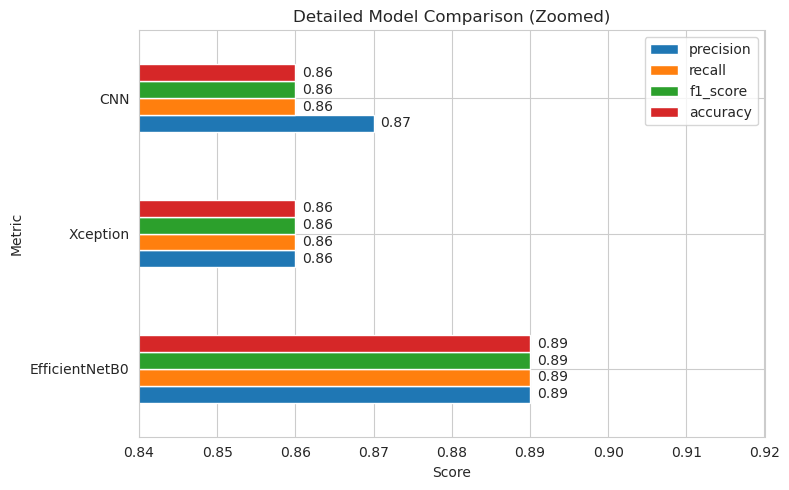

In [41]:
# Assuming df_metrics is already defined in the notebook as before
metrics = ['precision', 'recall', 'f1_score', 'accuracy']

plot_data = df_metrics[metrics]
fig, ax = plt.subplots(figsize=(8, 5))
plot_data.plot(kind='barh', ax=ax)
ax.set_xlim(0.84, 0.92)
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=5)

ax.set_xlabel('Score')
ax.set_ylabel('Metric')
ax.set_title('Detailed Model Comparison (Zoomed)')
plt.tight_layout()
plt.show()

## EfficientNet Hyperparameter Testing for Fine-tuning

### Hyperparameter tuning 

In [13]:
img_size = (224, 224)
batch_size = 32

In [14]:
def build_effnet_model(hp):
    base = tf.keras.applications.EfficientNetB0(
        weights='imagenet', include_top=False,
        input_shape=img_size + (3,)
    )
    base.trainable = False

    x = layers.GlobalAveragePooling2D()(base.output)
    x = layers.Dropout(
        rate=hp.Float('dropout', min_value=0.2, max_value=0.5, step=0.1)
    )(x)
    x = layers.Dense(
        units=hp.Int('units', min_value=32, max_value=128, step=32),
        activation='relu'
    )(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    model = tf.keras.Model(base.input, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
        ),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

In [ ]:
from tensorflow.keras import layers
tuner = kt.RandomSearch(
    build_effnet_model,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='kt_dir',
    project_name='effnet_hp_tuning'
)

tuner.search(
    train_gen224,
    validation_data=val_gen224,
    epochs=30
)

Trial 4 Complete [01h 24m 33s]
val_accuracy: 0.8586666584014893

Best val_accuracy So Far: 0.8863333463668823
Total elapsed time: 02h 56m 01s

Search: Running Trial #5

Value             |Best Value So Far |Hyperparameter
0.3               |0.2               |dropout
128               |128               |units
0.01              |0.001             |learning_rate

Epoch 1/30
 25/313 ━━━━━━━━━━━━━━━━━━━━ 2:11 457ms/step - accuracy: 0.6108 - loss: 0.7533

In [20]:
def build_optimized_model():
    # Base model (pre-trained)
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    base_model.trainable = False
    optimized_model = Sequential()
    optimized_model.add(base_model)
    optimized_model.add(GlobalAveragePooling2D())
    optimized_model.add(BatchNormalization())
    optimized_model.add(Dense(128, activation='swish'))  # Using 128 units from best trial
    optimized_model.add(Dropout(0.2))                   # Using 0.2 dropout (best value so far)

    optimized_model.add(BatchNormalization())
    optimized_model.add(Dense(128, activation='swish'))  
    optimized_model.add(Dropout(0.2))              
    optimized_model.add(Dense(1, activation='sigmoid'))
    
    optimized_model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # Using 0.001 (best value so far)
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    return optimized_model

In [21]:
optimized_model = build_optimized_model()
optimized_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,235,812 (16.16 MB)

 Trainable params: 183,425 (716.50 KB)

 Non-trainable params: 4,052,387 (15.46 MB)

In [24]:
history_optimized = optimized_model.fit(
    train_gen224,
    epochs=30, 
    validation_data=val_gen224,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=5,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ModelCheckpoint(
            'best_efficientnet_model.keras',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max'
        )
    ]
)

Epoch 1/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 597ms/step - accuracy: 0.8874 - loss: 0.2642 - val_accuracy: 0.8713 - val_loss: 0.2971
Epoch 2/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 596ms/step - accuracy: 0.8879 - loss: 0.2583 - val_accuracy: 0.8630 - val_loss: 0.3214
Epoch 3/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 597ms/step - accuracy: 0.8988 - loss: 0.2461 - val_accuracy: 0.8827 - val_loss: 0.2849
Epoch 4/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 186s 594ms/step - accuracy: 0.9029 - loss: 0.2372 - val_accuracy: 0.8897 - val_loss: 0.2768
Epoch 5/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 185s 591ms/step - accuracy: 0.9093 - loss: 0.2200 - val_accuracy: 0.8857 - val_loss: 0.2808
Epoch 6/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 597ms/step - accuracy: 0.9070 - loss: 0.2243 - val_accuracy: 0.8703 - val_loss: 0.3072
Epoch 7/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 597ms/step - accuracy: 0.9109 - loss: 0.2173 - val_accuracy: 0.8740 - val_loss: 0.3261
Epoch 8/30
313/313 ━━━━━━━━━━━━━━━━━━━━ 187s 597ms/step - accuracy: 0.9103 -

In [26]:
test_loss, test_accuracy = optimized_model.evaluate(test_gen224)
print(f'Loss: {test_loss}, Accuracy: {test_accuracy}')

47/47 ━━━━━━━━━━━━━━━━━━━━ 62s 1s/step - accuracy: 0.9005 - loss: 0.2644   
Loss: 0.27898964285850525, Accuracy: 0.887666642665863


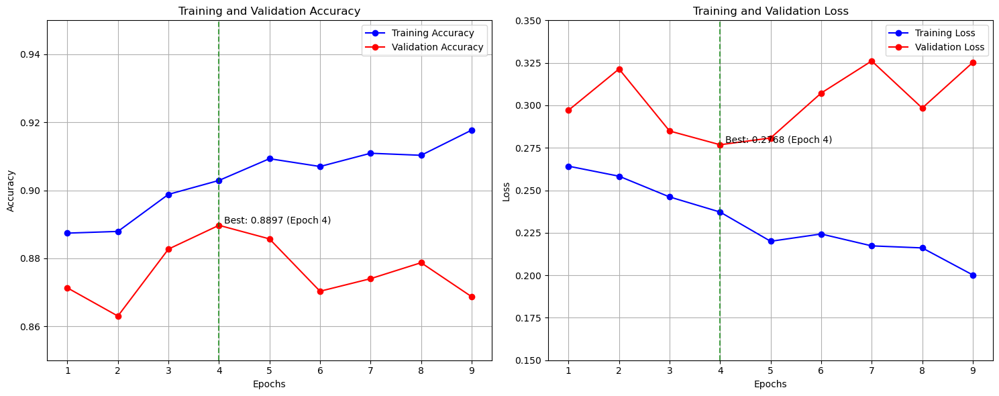

In [25]:
# Extract the data from the training logs
epochs = range(1, 10)
train_acc = [0.8874, 0.8879, 0.8988, 0.9029, 0.9093, 0.9070, 0.9109, 0.9103, 0.9177]
val_acc = [0.8713, 0.8630, 0.8827, 0.8897, 0.8857, 0.8703, 0.8740, 0.8787, 0.8687]
train_loss = [0.2642, 0.2583, 0.2461, 0.2372, 0.2200, 0.2243, 0.2173, 0.2161, 0.2002]
val_loss = [0.2971, 0.3214, 0.2849, 0.2768, 0.2808, 0.3072, 0.3261, 0.2984, 0.3252]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot accuracy
ax1.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
ax1.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
ax1.set_title('Training and Validation Accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.set_ylim([0.85, 0.95])
ax1.legend()
ax1.grid(True)

# Mark the best validation accuracy
best_epoch = val_acc.index(max(val_acc)) + 1
ax1.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7)
ax1.text(best_epoch+0.1, max(val_acc), f'Best: {max(val_acc):.4f} (Epoch {best_epoch})', 
         verticalalignment='bottom')

# Plot loss
ax2.plot(epochs, train_loss, 'bo-', label='Training Loss')
ax2.plot(epochs, val_loss, 'ro-', label='Validation Loss')
ax2.set_title('Training and Validation Loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.set_ylim([0.15, 0.35])
ax2.legend()
ax2.grid(True)

# Mark the best (lowest) validation loss
best_loss_epoch = val_loss.index(min(val_loss)) + 1
ax2.axvline(x=best_loss_epoch, color='g', linestyle='--', alpha=0.7)
ax2.text(best_loss_epoch+0.1, min(val_loss), f'Best: {min(val_loss):.4f} (Epoch {best_loss_epoch})', 
         verticalalignment='bottom')

plt.tight_layout()
plt.show()

Optimized model:

- Started with higher initial accuracy (~0.88)
- Reached peak validation accuracy of 0.8897 at epoch 4
- Early stopping kicked in at epoch 9
- Final training accuracy: 0.9177 vs validation accuracy: 0.8687

Earlier run (build_model):

- Started with lower initial accuracy (~0.66)
- Steadily improved throughout training
- Reached peak validation accuracy of 0.8790 at epoch 24
- Training accuracy: 0.9032 vs validation accuracy: 0.8760 at the end

### More Experiments

#### Layer Unfreezing Function

In [29]:
from tensorflow.keras.models import load_model
best_model = load_model('best_efficientnet_model.keras')

In [31]:
def unfreeze_model(model, num_layers_to_unfreeze=20):
    """
    Unfreeze a specified number of top layers in the EfficientNet base model
    """
    # Find the EfficientNet base model
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):  # This is likely the base model
            base_model = layer
            break
    
    # Initially set all layers to non-trainable
    base_model.trainable = True
    
    # Count total layers in the base model
    total_layers = len(base_model.layers)
    print(f"Total layers in base model: {total_layers}")
    
    # Freeze all layers initially
    for layer in base_model.layers:
        layer.trainable = False
    
    # Unfreeze only the specified number of top layers
    for layer in base_model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
        print(f"Unfrozen layer: {layer.name}")
    
    # Count trainable vs non-trainable parameters using the shape property instead of get_shape()
    trainable_params = np.sum([np.prod(v.shape) for v in model.trainable_weights])
    non_trainable_params = np.sum([np.prod(v.shape) for v in model.non_trainable_weights])
    
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Non-trainable parameters: {non_trainable_params:,}")
    
    return model

# Unfreeze the top 20 layers of the model
model_20_unfrozen = unfreeze_model(best_model, num_layers_to_unfreeze=20)

Total layers in base model: 238
Unfrozen layer: block6d_project_conv
Unfrozen layer: block6d_project_bn
Unfrozen layer: block6d_drop
Unfrozen layer: block6d_add
Unfrozen layer: block7a_expand_conv
Unfrozen layer: block7a_expand_bn
Unfrozen layer: block7a_expand_activation
Unfrozen layer: block7a_dwconv
Unfrozen layer: block7a_bn
Unfrozen layer: block7a_activation
Unfrozen layer: block7a_se_squeeze
Unfrozen layer: block7a_se_reshape
Unfrozen layer: block7a_se_reduce
Unfrozen layer: block7a_se_expand
Unfrozen layer: block7a_se_excite
Unfrozen layer: block7a_project_conv
Unfrozen layer: block7a_project_bn
Unfrozen layer: top_conv
Unfrozen layer: top_bn
Unfrozen layer: top_activation
Trainable parameters: 1,534,385
Non-trainable parameters: 2,701,427.0


#### Learning Rate Schedule Functions

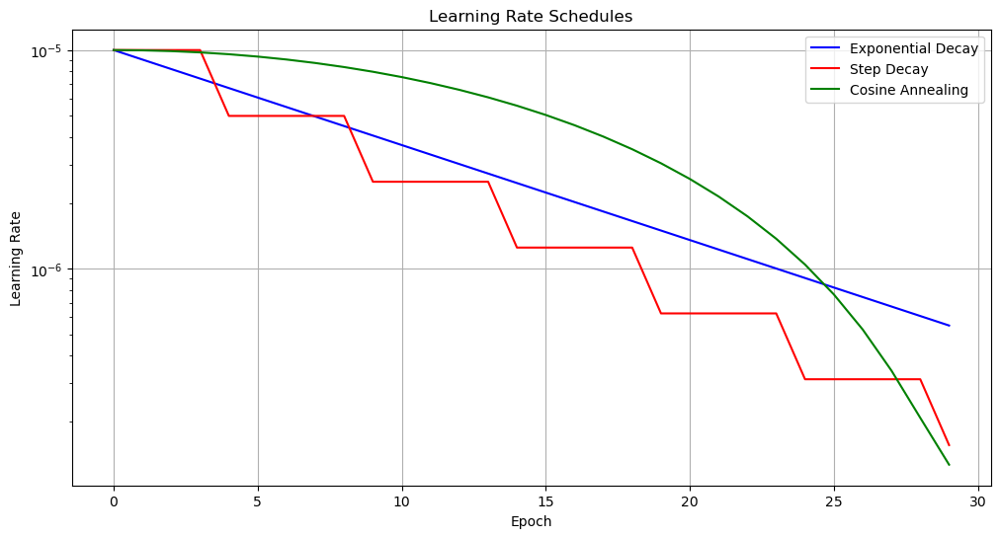

In [34]:
import math
# a. Exponential decay
def exp_decay(epoch):
    initial_lr = 1e-5
    k = 0.1
    lr = initial_lr * math.exp(-k * epoch)
    return lr

# b. Step decay
def step_decay(epoch):
    initial_lr = 1e-5
    drop = 0.5
    epochs_drop = 5
    lr = initial_lr * math.pow(drop, math.floor((1 + epoch) / epochs_drop))
    return lr

# c. Cosine annealing
def cosine_decay(epoch):
    initial_lr = 1e-5
    min_lr = 1e-7
    max_epochs = 30
    
    # Calculate cosine decay
    cosine = 0.5 * (1 + math.cos(math.pi * epoch / max_epochs))
    lr = min_lr + (initial_lr - min_lr) * cosine
    return lr

# Visualization of learning rate schedules
epochs = range(30)
exp_rates = [exp_decay(epoch) for epoch in epochs]
step_rates = [step_decay(epoch) for epoch in epochs]
cosine_rates = [cosine_decay(epoch) for epoch in epochs]

plt.figure(figsize=(12, 6))
plt.plot(epochs, exp_rates, 'b-', label='Exponential Decay')
plt.plot(epochs, step_rates, 'r-', label='Step Decay')
plt.plot(epochs, cosine_rates, 'g-', label='Cosine Annealing')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedules')
plt.legend()
plt.grid(True)
plt.yscale('log')
plt.show()

#### Fine-Tuning Function

In [35]:
def fine_tune_model(model, train_gen, val_gen, lr_schedule='constant', 
                    constant_lr=1e-5, epochs=20, unfreeze_layers=20):
    """
    Fine-tune the model with a specified learning rate schedule
    """
    # First unfreeze layers (make a copy to avoid modifying the original)
    model_copy = tf.keras.models.clone_model(model)
    model_copy.set_weights(model.get_weights())
    model_tuned = unfreeze_model(model_copy, unfreeze_layers)
    
    # Set up learning rate strategy
    if lr_schedule == 'constant':
        optimizer = tf.keras.optimizers.Adam(learning_rate=constant_lr)
        lr_callback = None
    elif lr_schedule == 'exponential':
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
        lr_callback = LearningRateScheduler(exp_decay)
    elif lr_schedule == 'step':
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
        lr_callback = LearningRateScheduler(step_decay)
    elif lr_schedule == 'cosine':
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
        lr_callback = LearningRateScheduler(cosine_decay)
    elif lr_schedule == 'reduce_on_plateau':
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
        lr_callback = ReduceLROnPlateau(
            monitor='val_accuracy',
            factor=0.5,
            patience=3,
            min_lr=1e-7,
            verbose=1
        )
    
    # Recompile the model
    model_tuned.compile(
        optimizer=optimizer,
        loss='binary_crossentropy',  # Make sure this matches your original loss function
        metrics=['accuracy']
    )
    
    # Define callbacks
    callbacks = [
        EarlyStopping(
            monitor='val_accuracy',
            patience=7,
            restore_best_weights=True
        ),
        ModelCheckpoint(
            f'fine_tuned_efficientnet_{lr_schedule}_{unfreeze_layers}layers.keras',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max'
        )
    ]
    
    # Add the learning rate callback if applicable
    if lr_callback:
        callbacks.append(lr_callback)
    
    # Train the model
    history = model_tuned.fit(
        train_gen,
        epochs=epochs,
        validation_data=val_gen,
        callbacks=callbacks
    )
    
    return model_tuned, history

#### Trial & Finding

In [ ]:
experiments = [
    {'name': 'constant_1e-5', 'schedule': 'constant', 'lr': 1e-5, 'unfreeze': 20},
    {'name': 'constant_1e-6', 'schedule': 'constant', 'lr': 1e-6, 'unfreeze': 20},
    {'name': 'exponential', 'schedule': 'exponential', 'lr': None, 'unfreeze': 20},
    {'name': 'cosine', 'schedule': 'cosine', 'lr': None, 'unfreeze': 20}
]

# Dictionary to store results
results = {}

# Run each experiment
for exp in experiments:
    print(f"\n\n{'='*50}")
    print(f"Starting experiment: {exp['name']}")
    print(f"{'='*50}\n")
    
    # Make a deep copy of the model
    model_copy = tf.keras.models.clone_model(best_model)
    model_copy.set_weights(best_model.get_weights())
    
    # Run fine-tuning
    tuned_model, history = fine_tune_model(
        model_copy,
        train_gen224,  # Your training data generator
        val_gen224,    # Your validation data generator
        lr_schedule=exp['schedule'],
        constant_lr=exp['lr'] if exp['lr'] else 1e-5,
        epochs=15,
        unfreeze_layers=exp['unfreeze']
    )
    
    # Evaluate on test set
    test_loss, test_acc = tuned_model.evaluate(test_gen224)
    
    # Store results
    results[exp['name']] = {
        'history': history.history,
        'test_acc': test_acc,
        'test_loss': test_loss
    }
    
    print(f"\nTest accuracy: {test_acc:.4f}")
    print(f"Test loss: {test_loss:.4f}")



Starting experiment: constant_1e-5

Total layers in base model: 238
Unfrozen layer: block6d_project_conv
Unfrozen layer: block6d_project_bn
Unfrozen layer: block6d_drop
Unfrozen layer: block6d_add
Unfrozen layer: block7a_expand_conv
Unfrozen layer: block7a_expand_bn
Unfrozen layer: block7a_expand_activation
Unfrozen layer: block7a_dwconv
Unfrozen layer: block7a_bn
Unfrozen layer: block7a_activation
Unfrozen layer: block7a_se_squeeze
Unfrozen layer: block7a_se_reshape
Unfrozen layer: block7a_se_reduce
Unfrozen layer: block7a_se_expand
Unfrozen layer: block7a_se_excite
Unfrozen layer: block7a_project_conv
Unfrozen layer: block7a_project_bn
Unfrozen layer: top_conv
Unfrozen layer: top_bn
Unfrozen layer: top_activation
Trainable parameters: 1,534,385
Non-trainable parameters: 2,701,427.0
Epoch 1/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 239s 714ms/step - accuracy: 0.7497 - loss: 0.5940 - val_accuracy: 0.8097 - val_loss: 0.4528
Epoch 2/15
313/313 ━━━━━━━━━━━━━━━━━━━━ 221s 707ms/step - accuracy: 0.8

In [19]:
results = {} # Retrieve from gpu cut down

# Extract metrics for constant_1e-5
constant_1e5_history = {
    'accuracy': [0.7497, 0.8076, 0.8255, 0.8369, 0.8436, 0.8559, 0.8642, 0.8644, 0.8716, 0.8803, 0.8825, 0.8903, 0.8951, 0.8984, 0.8991],
    'val_accuracy': [0.8097, 0.8123, 0.8210, 0.8353, 0.8327, 0.8483, 0.8447, 0.8563, 0.8540, 0.8663, 0.8723, 0.8770, 0.8730, 0.8783, 0.8770],
    'loss': [0.5940, 0.4536, 0.4059, 0.3771, 0.3548, 0.3320, 0.3277, 0.3134, 0.2972, 0.2863, 0.2760, 0.2624, 0.2516, 0.2425, 0.2416],
    'val_loss': [0.4528, 0.4358, 0.4171, 0.3913, 0.3908, 0.3548, 0.3495, 0.3299, 0.3304, 0.3213, 0.2935, 0.2914, 0.2921, 0.2927, 0.2911],
    'test_acc': 0.8723,
    'test_loss': 0.3128
}

# Extract metrics for constant_1e-6
constant_1e6_history = {
    'accuracy': [0.7229, 0.7390, 0.7607, 0.7685, 0.7777, 0.7881, 0.7887, 0.7959, 0.7944, 0.7969, 0.7911, 0.8028, 0.8023, 0.8110, 0.8172],
    'val_accuracy': [0.7573, 0.7533, 0.7710, 0.7847, 0.7887, 0.7930, 0.7940, 0.7983, 0.7967, 0.8090, 0.8077, 0.8130, 0.8113, 0.8093, 0.8120],
    'loss': [0.6666, 0.6146, 0.5778, 0.5489, 0.5284, 0.5071, 0.5045, 0.5008, 0.4860, 0.4833, 0.4719, 0.4555, 0.4637, 0.4478, 0.4395],
    'val_loss': [0.5738, 0.5649, 0.5324, 0.5134, 0.5022, 0.4915, 0.4938, 0.4819, 0.4809, 0.4556, 0.4576, 0.4344, 0.4441, 0.4547, 0.4299],
    'test_acc': 0.8000,
    'test_loss': 0.4891
}

# Extract metrics for exponential decay
exponential_history = {
    'accuracy': [0.7588, 0.8080, 0.8237, 0.8405, 0.8411, 0.8511, 0.8565, 0.8494, 0.8573, 0.8619, 0.8675, 0.8671, 0.8665, 0.8775, 0.8736],
    'val_accuracy': [0.8080, 0.8133, 0.8210, 0.8320, 0.8310, 0.8407, 0.8453, 0.8387, 0.8513, 0.8523, 0.8607, 0.8547, 0.8583, 0.8560, 0.8627],
    'loss': [0.5771, 0.4602, 0.4124, 0.3715, 0.3705, 0.3458, 0.3371, 0.3411, 0.3304, 0.3104, 0.3129, 0.3137, 0.3010, 0.2909, 0.2914],
    'val_loss': [0.4595, 0.4340, 0.4194, 0.3943, 0.3919, 0.3661, 0.3612, 0.3633, 0.3414, 0.3501, 0.3285, 0.3293, 0.3283, 0.3340, 0.3249],
    'learning_rate': [1.0000e-05, 9.0484e-06, 8.1873e-06, 7.4082e-06, 6.7032e-06, 6.0653e-06, 
                      5.4881e-06, 4.9659e-06, 4.4933e-06, 4.0657e-06, 3.6788e-06, 3.3287e-06, 
                      3.0119e-06, 2.7253e-06, 2.4660e-06],
    'test_acc': 0.8557,
    'test_loss': 0.3398
}

# Extract metrics for cosine annealing
cosine_history = {
    'accuracy': [0.7642, 0.8091, 0.8232, 0.8375, 0.8470, 0.8528, 0.8648, 0.8658, 0.8670, 0.8771, 0.8887, 0.8898, 0.8893, 0.8904],
    'val_accuracy': [0.8043, 0.8230, 0.8353, 0.8320, 0.8467, 0.8500, 0.8530, 0.8557, 0.8583, 0.8720, 0.8737, 0.8670, 0.8743, 0.8777],
    'loss': [0.5655, 0.4450, 0.4063, 0.3722, 0.3523, 0.3463, 0.3161, 0.3152, 0.3082, 0.2850, 0.2656, 0.2618, 0.2619, 0.2570],
    'val_loss': [0.4618, 0.4139, 0.3989, 0.3974, 0.3647, 0.3537, 0.3514, 0.3305, 0.3293, 0.3056, 0.2949, 0.3037, 0.2956, 0.2986],
    'learning_rate': [1.0000e-05, 9.9729e-06, 9.8918e-06, 9.7577e-06, 9.5720e-06, 9.3368e-06, 
                     9.0546e-06, 8.7286e-06, 8.3622e-06, 7.5250e-06, 7.0633e-06, 6.5796e-06, 
                     6.0792e-06, 5.5674e-06],
    'test_acc': 0.8640,
    'test_loss': 0.3166
}

In [21]:
cosine_history['accuracy'].append(cosine_history['accuracy'][-1])
cosine_history['val_accuracy'].append(cosine_history['val_accuracy'][-1])
cosine_history['loss'].append(cosine_history['loss'][-1])
cosine_history['val_loss'].append(cosine_history['val_loss'][-1])
cosine_history['learning_rate'].append(5.5674e-06)  # Repeating the last learning rate

In [22]:
results['constant_1e-5'] = constant_1e5_history
results['constant_1e-6'] = constant_1e6_history
results['exponential'] = exponential_history
results['cosine'] = cosine_history

In [24]:
summary = []
for name, result in results.items():
    max_val_acc = max(result['val_accuracy'])
    min_val_loss = min(result['val_loss'])
    
    summary.append({
        'Strategy': name,
        'Test Accuracy': result['test_acc'],
        'Test Loss': result['test_loss'],
        'Best Val Accuracy': max_val_acc,
        'Best Val Loss': min_val_loss,
        'Epochs Run': len(result['accuracy'])
    })

summary_df = pd.DataFrame(summary)
summary_df = summary_df.sort_values('Test Accuracy', ascending=False)
print("Summary of Fine-Tuning Experiments:")
print(summary_df)

Summary of Fine-Tuning Experiments:
        Strategy  Test Accuracy  Test Loss  Best Val Accuracy  Best Val Loss  \
0  constant_1e-5         0.8723     0.3128             0.8783         0.2911   
3         cosine         0.8640     0.3166             0.8777         0.2949   
2    exponential         0.8557     0.3398             0.8627         0.3249   
1  constant_1e-6         0.8000     0.4891             0.8130         0.4299   

   Epochs Run  
0          15  
3          15  
2          15  
1          15  


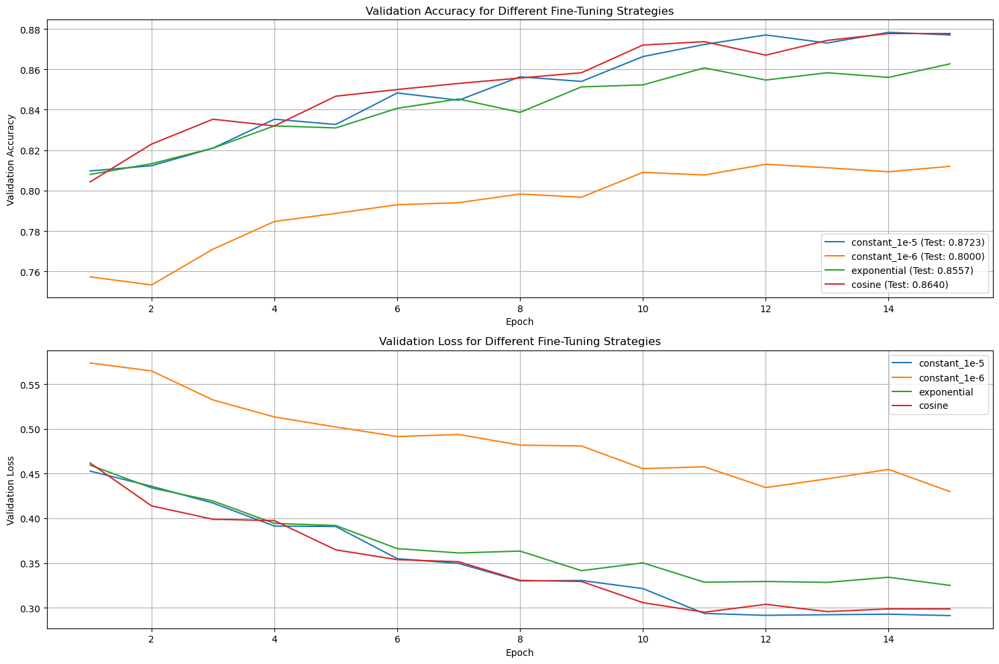

In [25]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
for name, result in results.items():
    plt.plot(range(1, len(result['val_accuracy'])+1), 
             result['val_accuracy'], 
             label=f"{name} (Test: {result['test_acc']:.4f})")

plt.title('Validation Accuracy for Different Fine-Tuning Strategies')
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.grid(True)

plt.subplot(2, 1, 2)
for name, result in results.items():
    plt.plot(range(1, len(result['val_loss'])+1), 
             result['val_loss'], 
             label=name)

plt.title('Validation Loss for Different Fine-Tuning Strategies')
plt.ylabel('Validation Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)

plt.tight_layout()

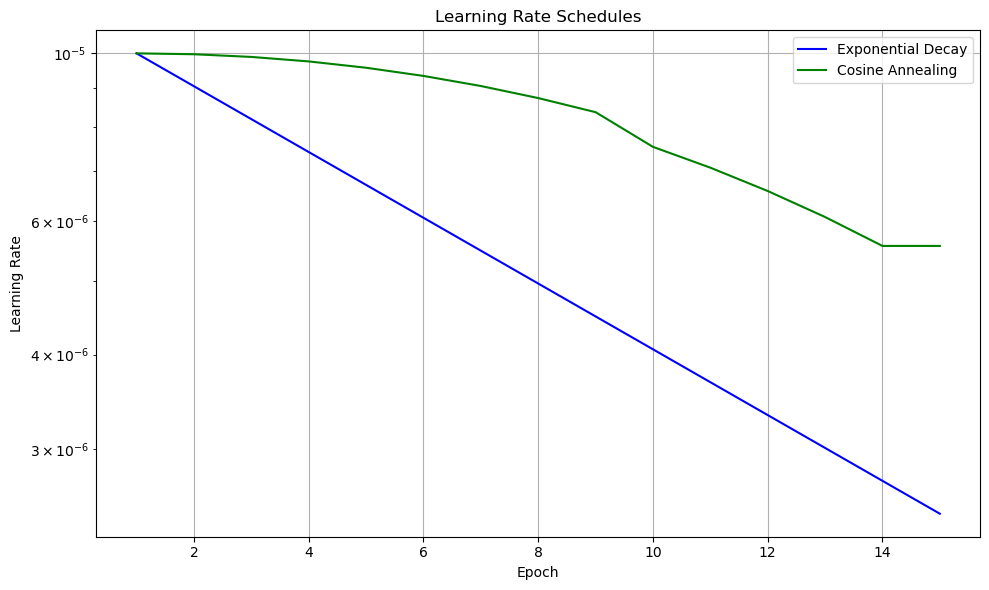

In [26]:
# Comparison of learning rate schedules
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(results['exponential']['learning_rate'])+1), 
         results['exponential']['learning_rate'], 
         'b-', label='Exponential Decay')
plt.plot(range(1, len(results['cosine']['learning_rate'])+1), 
         results['cosine']['learning_rate'], 
         'g-', label='Cosine Annealing')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedules')
plt.legend()
plt.grid(True)
plt.yscale('log')

# Show the plots
plt.tight_layout()
plt.show()

#### Key Findings from Your Experiments:

- Best Performing Strategy:
The constant learning rate of 1e-5 achieved the highest test accuracy at 0.8723, followed by cosine annealing at 0.8640.
- Learning Rate Importance:
The significant gap between constant 1e-5 (0.8723) and constant 1e-6 (0.8000) shows how critical the learning rate value is for fine-tuning.
- Validation Accuracy Patterns:
Constant 1e-5 showed consistent improvement throughout training；
Cosine annealing had stronger early performance and maintained good accuracy；
Exponential decay stabilized earlier but didn't reach the same peaks；
Constant 1e-6 was consistently behind, suggesting it was too conservative

- Convergence Speed:
Constant 1e-5 and cosine annealing reached 0.86+ validation accuracy within 10 epochs；Constant 1e-6 was still below 0.82 even after 15 epochs

## Grad_CAM

In [46]:
# Print layers of each model to find the correct layer names
print("Custom CNN layers:")
for layer in model_cnn.layers:
    print(layer.name)

print("\nXception layers:")
for layer in Xception_model.layers:
    print(layer.name)

print("\nEfficientNet layers:")
for layer in EfficientNet_model.layers:
    print(layer.name)

Custom CNN layers:
conv2d
max_pooling2d
conv2d_1
max_pooling2d_1
conv2d_2
max_pooling2d_2
dropout
flatten
dense
dropout_1
dense_1

Xception layers:
xception
flatten_1
batch_normalization_4
dense_2
dropout_2
dense_3
dropout_3
batch_normalization_5
dense_4

EfficientNet layers:
efficientnetb0
global_average_pooling2d
batch_normalization_6
dense_5
dropout_4
batch_normalization_7
dense_6
dropout_5
dense_7


In [65]:
def occlusion_sensitivity(model, image, label, size=32, stride=8):
    height, width, _ = image.shape
    sensitivity_map = np.zeros((height, width))
    original_prediction = model.predict(np.expand_dims(image, axis=0), verbose=0)[0][0]
    
    for x in range(0, width-size, stride):
        for y in range(0, height-size, stride):
            occluded_image = np.copy(image)
            occluded_image[y:y+size, x:x+size, :] = 0
            new_prediction = model.predict(np.expand_dims(occluded_image, axis=0), verbose=0)[0][0]
            
            if label == 'real':
                diff = original_prediction - new_prediction
            else:
                diff = new_prediction - original_prediction
            
            sensitivity_map[y:y+size, x:x+size] += diff
    
    sensitivity_map = (sensitivity_map - np.min(sensitivity_map)) / (np.max(sensitivity_map) - np.min(sensitivity_map) + 1e-7)
    return sensitivity_map

def analyze_image(img_path, label):
    import os
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    
    img_cnn = load_img(img_path, target_size=(256, 256))
    img_array_cnn = img_to_array(img_cnn) / 255.0
    
    img_efficientnet = load_img(img_path, target_size=(224, 224))
    img_array_efficientnet = img_to_array(img_efficientnet) / 255.0
    
    # Get predictions
    cnn_input = np.expand_dims(img_array_cnn, 0)
    cnn_pred = model_cnn.predict(cnn_input, verbose=0)[0][0]
    
    xception_input = np.expand_dims(img_array_cnn, 0)
    xception_pred = Xception_model.predict(xception_input, verbose=0)[0][0]
    
    efficientnet_input = np.expand_dims(img_array_efficientnet, 0)
    efficientnet_pred = EfficientNet_model.predict(efficientnet_input, verbose=0)[0][0]
    
    print(f"Image: {os.path.basename(img_path)}")
    print(f"CNN prediction: {cnn_pred:.4f} ({'Fake' if cnn_pred > 0.5 else 'Real'})")
    print(f"Xception prediction: {xception_pred:.4f} ({'Fake' if xception_pred > 0.5 else 'Real'})")
    print(f"EfficientNet prediction: {efficientnet_pred:.4f} ({'Fake' if efficientnet_pred > 0.5 else 'Real'})")
    
    # Redirect stdout to suppress progress messages
    import sys
    old_stdout = sys.stdout
    sys.stdout = open(os.devnull, 'w')
    
    # Generate maps
    cnn_sensitivity = occlusion_sensitivity(model_cnn, img_array_cnn, label, size=24, stride=12)
    xception_sensitivity = occlusion_sensitivity(Xception_model, img_array_cnn, label, size=24, stride=12)
    efficientnet_sensitivity = occlusion_sensitivity(EfficientNet_model, img_array_efficientnet, label, size=24, stride=12)
    
    # Restore stdout
    sys.stdout.close()
    sys.stdout = old_stdout
    
    # Plot results
    plt.figure(figsize=(15, 15))
    
    # Original images and maps
    plt.subplot(3, 3, 1)
    plt.imshow(img_array_cnn)
    plt.title(f'Original ({label.capitalize()})')
    plt.axis('off')
    
    # CNN
    plt.subplot(3, 3, 2)
    plt.imshow(cnn_sensitivity, cmap='jet')
    plt.title(f'CNN Map: {cnn_pred:.2f}')
    plt.axis('off')
    
    plt.subplot(3, 3, 3)
    plt.imshow(img_array_cnn)
    plt.imshow(cnn_sensitivity, cmap='jet', alpha=0.7)
    plt.title('CNN Overlay')
    plt.axis('off')
    
    # Xception
    plt.subplot(3, 3, 5)
    plt.imshow(xception_sensitivity, cmap='jet')
    plt.title(f'Xception Map: {xception_pred:.2f}')
    plt.axis('off')
    
    plt.subplot(3, 3, 6)
    plt.imshow(img_array_cnn)
    plt.imshow(xception_sensitivity, cmap='jet', alpha=0.7)
    plt.title('Xception Overlay')
    plt.axis('off')
    
    # EfficientNet
    plt.subplot(3, 3, 8)
    plt.imshow(efficientnet_sensitivity, cmap='jet')
    plt.title(f'EfficientNet Map: {efficientnet_pred:.2f}')
    plt.axis('off')
    
    plt.subplot(3, 3, 9)
    plt.imshow(img_array_efficientnet)
    plt.imshow(efficientnet_sensitivity, cmap='jet', alpha=0.7)
    plt.title('EfficientNet Overlay')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Image: 13135.jpg
CNN prediction: 0.4551 (Real)
Xception prediction: 0.5096 (Fake)
EfficientNet prediction: 0.5041 (Fake)


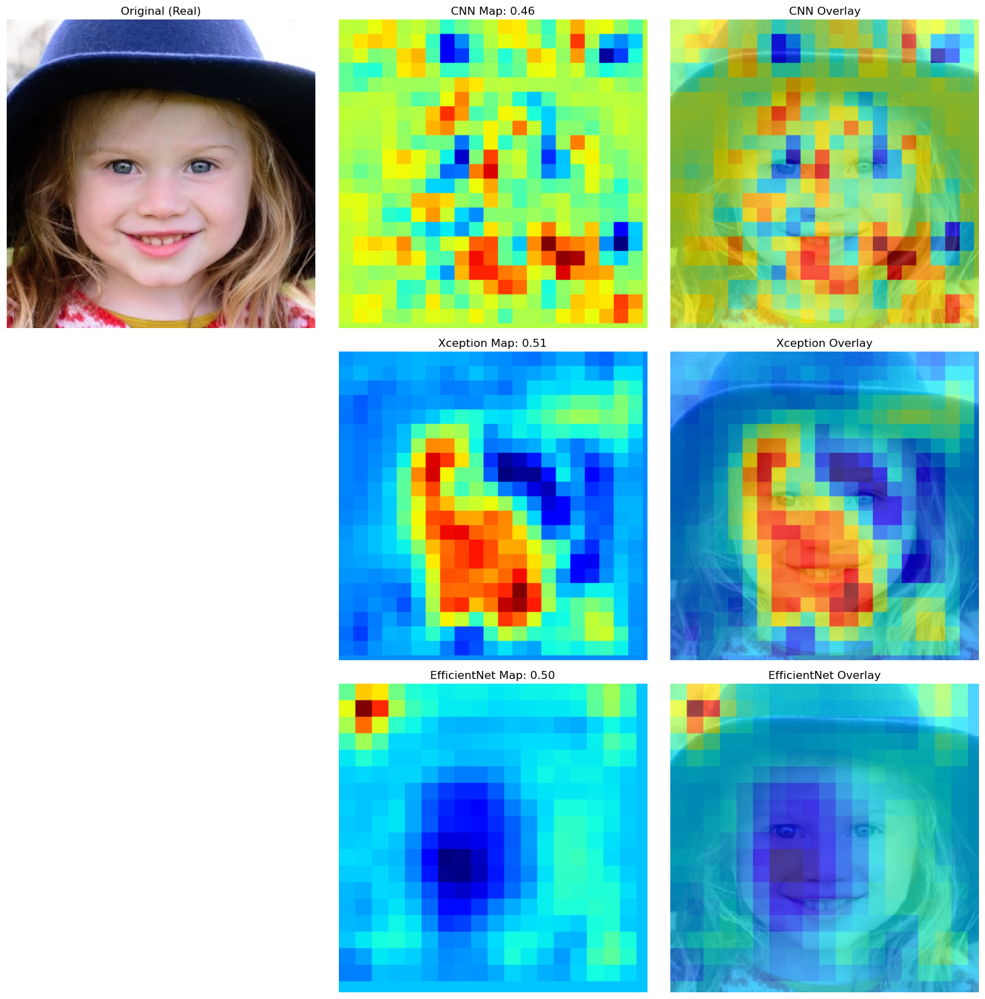

Image: PLYJBHBQH8.jpg
CNN prediction: 0.4533 (Real)
Xception prediction: 0.4025 (Real)
EfficientNet prediction: 0.5041 (Fake)


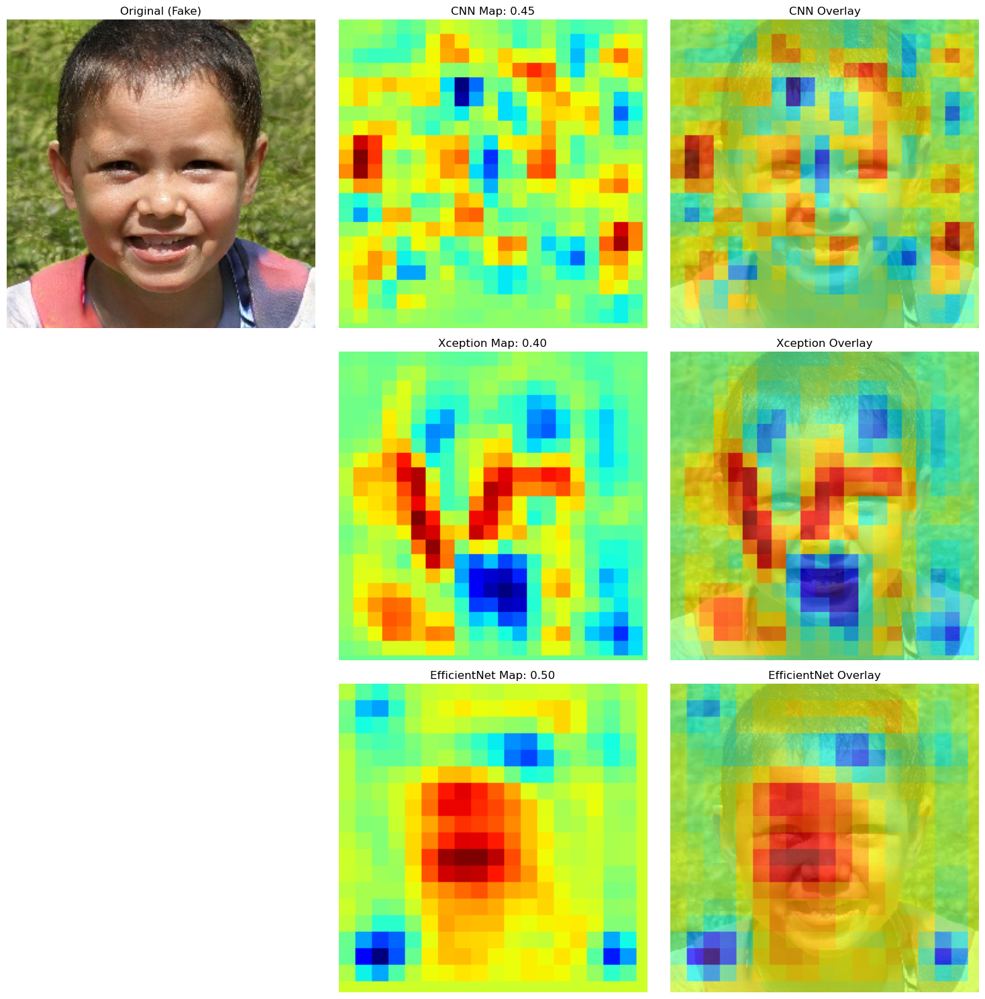

In [66]:
# Analyze a real image silently
real_img_path = os.path.join(base_path, "train", "real", os.listdir(os.path.join(base_path, "train", "real"))[0])
analyze_image(real_img_path, 'real')

# Analyze a fake image silently
fake_img_path = os.path.join(base_path, "train", "fake", os.listdir(os.path.join(base_path, "train", "fake"))[0])
analyze_image(fake_img_path, 'fake')

In [ ]:
# Analyze a real image
print("\n=== Analyzing Real Image ===")
# Use the first real image from your list
real_img_path = os.path.join(base_path, "train", "real", os.listdir(os.path.join(base_path, "train", "real"))[1])
analyze_image(real_img_path, 'real')

# Analyze a fake image
print("\n=== Analyzing Fake Image ===")
# Use the first fake image from your list
fake_img_path = os.path.join(base_path, "train", "fake", os.listdir(os.path.join(base_path, "train", "fake"))[1])
analyze_image(fake_img_path, 'fake')


=== Analyzing Real Image ===
Image: 47394.jpg
CNN prediction: 0.4368 (Real)
Xception prediction: 0.4487 (Real)
EfficientNet prediction: 0.5042 (Fake)
